In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob
import math
plt.rcParams['image.cmap'] = 'gray'

In [3]:
image_file_1 = '../Applications/scene/scene1.jpg'
image_file_2 = '../Applications/scene/scene2.jpg'

img_1 = cv2.imread(image_file_1,cv2.IMREAD_COLOR)
img_2 = cv2.imread(image_file_2,cv2.IMREAD_COLOR)

img_gray_1 = cv2.cvtColor(img_1,cv2.COLOR_BGR2GRAY)
img_gray_2 = cv2.cvtColor(img_2,cv2.COLOR_BGR2GRAY)

In [4]:
MAX_FEATURES = 500
orb = cv2.ORB_create(MAX_FEATURES)
keypoints1, descriptors1 = orb.detectAndCompute(img_gray_1, None)
keypoints2, descriptors2 = orb.detectAndCompute(img_gray_2, None)

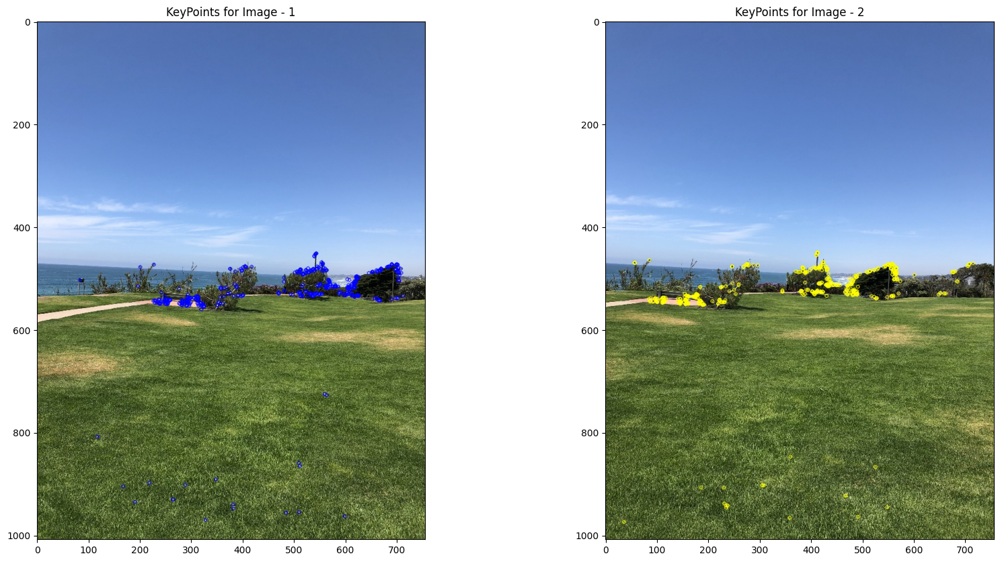

In [6]:
img_keypoints1 = cv2.drawKeypoints(img_1,keypoints1,None,color=(255,0,0),flags = cv2.DRAW_MATCHES_FLAGS_DEFAULT)
img_keypoints2 = cv2.drawKeypoints(img_2,keypoints2,None,color=(0,255,255),flags = cv2.DRAW_MATCHES_FLAGS_DEFAULT)

plt.figure(figsize=(20,10))
plt.subplot(121);plt.imshow(img_keypoints1[:,:,::-1]);plt.title("KeyPoints for Image - 1")
plt.subplot(122);plt.imshow(img_keypoints2[:,:,::-1]);plt.title("KeyPoints for Image - 2")
plt.show()

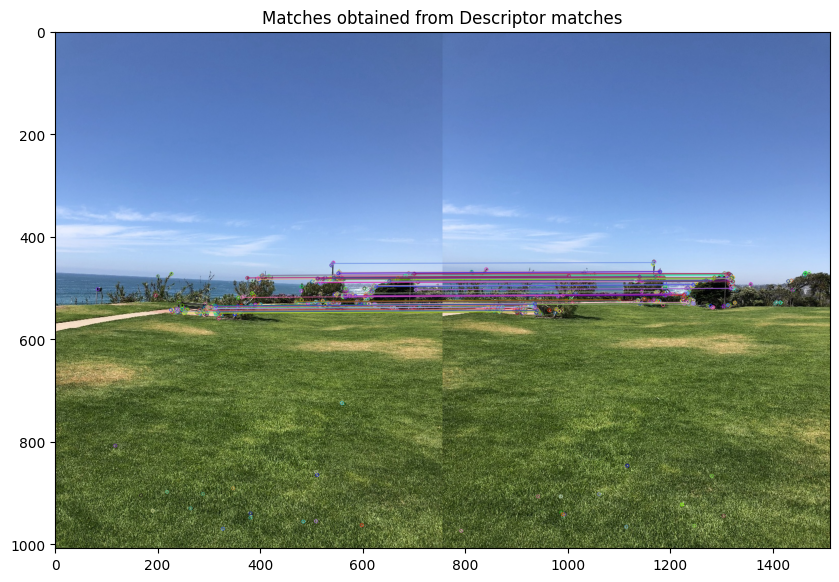

In [8]:
#Finding matching descriptors
matcher = cv2.DescriptorMatcher_create(cv2.DESCRIPTOR_MATCHER_BRUTEFORCE_HAMMING)
matches = matcher.match(descriptors1,descriptors2)

matches = sorted(matches,key= lambda x: x.distance, reverse=False)

GOOD_MATCH_PERCENT = 0.15
numGoodMatches = int(len(matches) * GOOD_MATCH_PERCENT)
matches = matches[:numGoodMatches]

img_matches = cv2.drawMatches(img_1, keypoints1, img_2, keypoints2, matches, None)
plt.figure(figsize=(10,10))
plt.imshow(img_matches[:,:,::-1])
plt.title("Matches obtained from Descriptor matches")
plt.show()

In [9]:
x1_zoom = 200;x2_zoom = 1400
y1_zoom = 380;y2_zoom = 600

In [10]:
zoomed = img_matches.copy()

In [11]:
zoomed = zoomed[y1_zoom:y2_zoom,x1_zoom:x2_zoom]

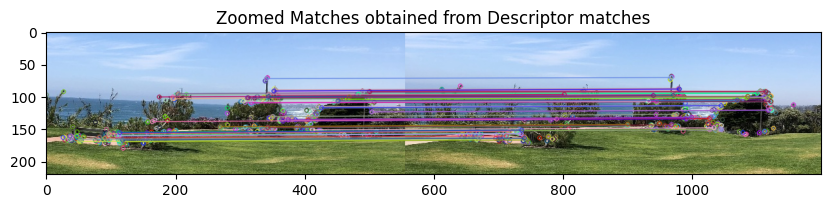

In [12]:
plt.figure(figsize=(10,10))
plt.imshow(zoomed[:,:,::-1])
plt.title("Zoomed Matches obtained from Descriptor matches")
plt.show()

In [13]:
# Image alignment 
points1 = np.zeros((len(matches),2), dtype=np.float32)
points2 = np.zeros((len(matches),2), dtype=np.float32)

for i , match in enumerate(matches):
    points1[i,:] = keypoints1[match.queryIdx].pt
    points2[i,:] = keypoints2[match.trainIdx].pt

h, mask = cv2.findHomography(points2,points1, cv2.RANSAC)

In [17]:
#Wrap the image
img1_h, img1_w, channels = img_1.shape
img2_h, img2_w, channels = img_2.shape

img2_alligned = cv2.warpPerspective(img_2, h, (img2_w + img1_w,img2_h))

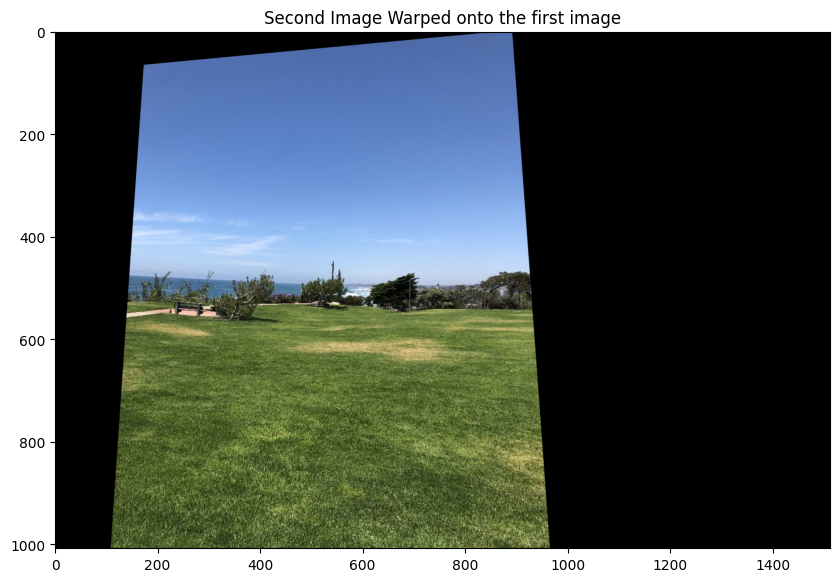

In [19]:
plt.figure(figsize=(10,10))
plt.imshow(img2_alligned[:,:,::-1])
plt.title("Second Image Warped onto the first image")
plt.show()

In [21]:
#Stitching image
stitched_image = np.copy(img2_alligned)
stitched_image[0:img1_h,0:img1_w] = img_1

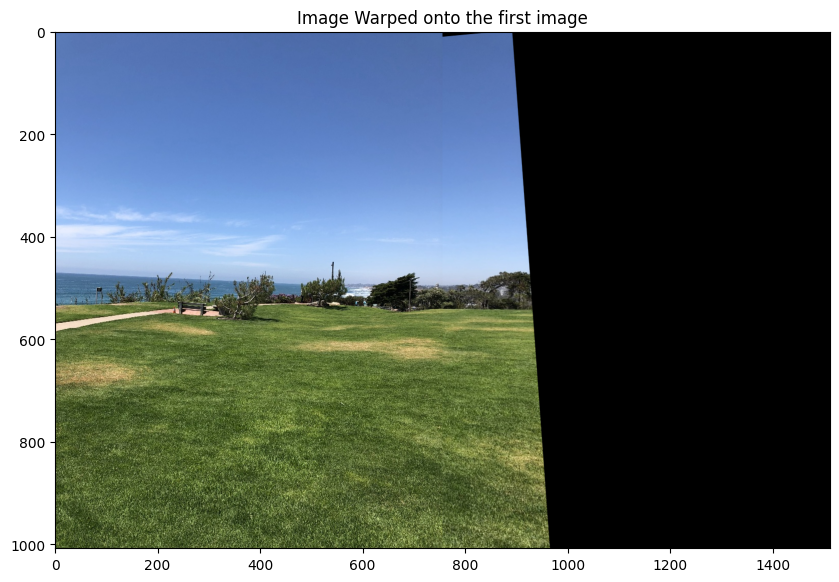

In [22]:
plt.figure(figsize=(10,10))
plt.imshow(stitched_image[:,:,::-1])
plt.title("Image Warped onto the first image")
plt.show()

In [24]:
#Using OpenCV class
imageFiles = glob.glob('../Applications/scene/*')
imageFiles.sort()
print(imageFiles)

images = []
for filename in imageFiles:
    img = cv2.imread(filename,cv2.IMREAD_COLOR)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    images.append(img_gray)

num_images = len(images)

['../Applications/scene\\scene1.jpg', '../Applications/scene\\scene2.jpg', '../Applications/scene\\scene3.jpg', '../Applications/scene\\scene4.jpg', '../Applications/scene\\scene5.jpg', '../Applications/scene\\scene6.jpg', '../Applications/scene\\scene7.jpg', '../Applications/scene\\scene8.jpg']


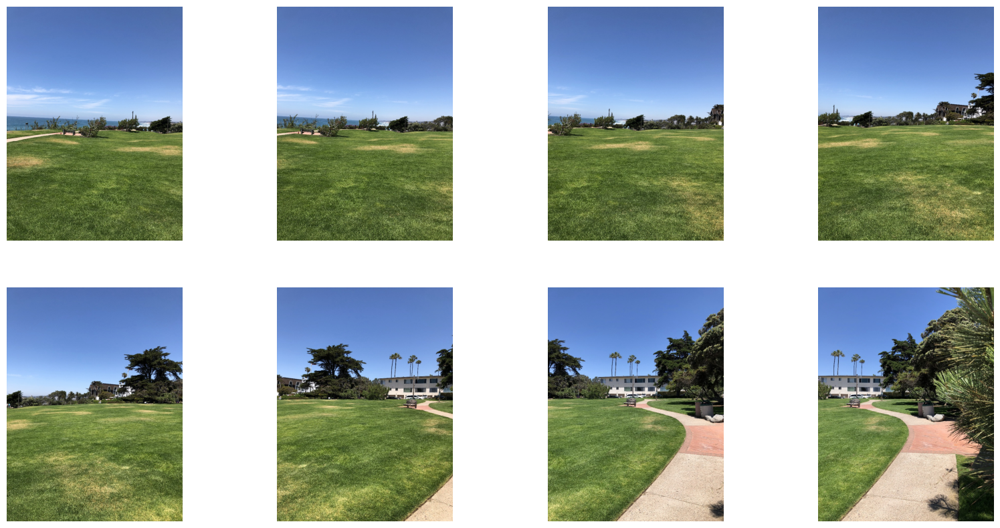

In [25]:
plt.figure(figsize=(20,10))
num_cols = 4 
num_rows = math.ceil(num_images / num_cols)
for i in range(0,num_images):
    plt.subplot(num_rows,num_cols,i+1)
    plt.axis('off')
    plt.imshow(images[i])

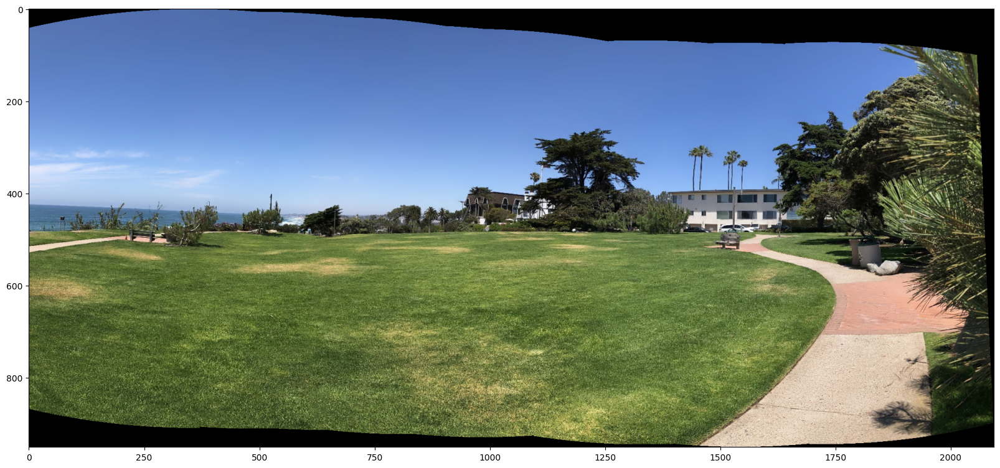

In [26]:
stitcher = cv2.Stitcher_create()
status, panorama = stitcher.stitch(images)
if status == 0:
    plt.figure(figsize=(20,10))
    plt.imshow(panorama)

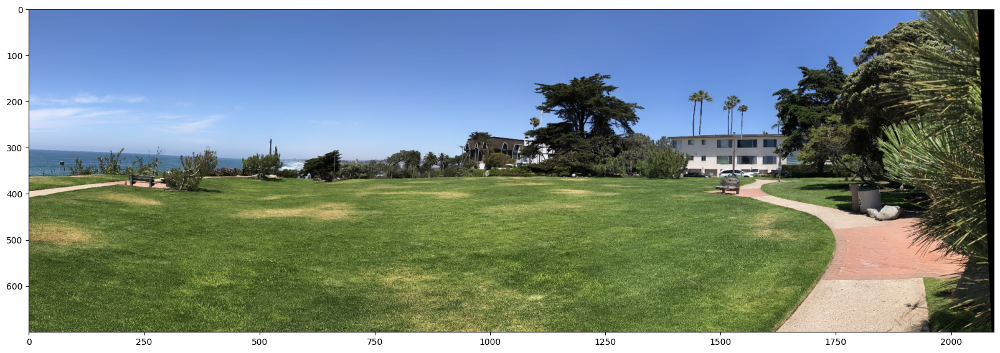

In [27]:
plt.figure(figsize=(20,10))
cropped_image = panorama.copy()
cropped_image = cropped_image[120:820,1:2100]
plt.imshow(cropped_image)
plt.show()